# Восстановление золота из руды
## Описание проекта
В нашем распоряжении находятся данные, отражающие процесс переработки руды с содержанием цветных металлов. Процесс включает в себя стадию флотации, первичной и вторичной очистки.

Необходимо создать модель машинного обучения, предсказывающую показатели восстановления золота на на выходе из флотационной установки и после очистки.

Данные содержатся в трех файлах - исходном, предназначенном для обучения модели и финальной проверки. Особенность подхода заключается в том, что не все показатели доступны в тестовой выборке, поэтому обучение и валидацию модели необходимо провести на имеющихся, а прочие использовать в ходе подготовки и анализа.

Для оценки качества модели предполагается задействовать метрику симметричной средней абсолютной процентной ошибки (sMAPE) для каждого из предсказываемых показателей, сбалансированную в одно итоговое значение в соотношении 1 к 3.
## Описание данных
**Технологический процесс:**

- Rougher feed — исходное сырье
- Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
- Xanthate **— ксантогенат (промотер, или активатор флотации);
- Sulphate — сульфат (на данном производстве сульфид натрия);
- Depressant — депрессант (силикат натрия).
- Rougher process (англ. «грубый процесс») — флотация
- Rougher tails — отвальные хвосты
- Float banks — флотационная установка
- Cleaner process — очистка
- Rougher Au — черновой концентрат золота
- Final Au — финальный концентрат золота

**Параметры этапов:**

- air amount — объём воздуха
- fluid levels — уровень жидкости
- feed size — размер гранул сырья
- feed rate — скорость подачи

**Наименование признаков:**

Наименование признаков должно быть такое: [этап].[тип_параметра].[название_параметра]

*Пример: rougher.input.feed_ag*

**Возможные значения для блока [этап]:**

- rougher — флотация
- primary_cleaner — первичная очистка
- secondary_cleaner — вторичная очистка
- final — финальные характеристики

**Возможные значения для блока [тип_параметра]:**

- input — параметры сырья
- output — параметры продукта
- state — параметры, характеризующие текущее состояние этапа
- calculation — расчётные характеристики

## Загрузка библиотек

In [1]:
!pip install -q optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 8.5 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import collections
import re

# визуализация
import matplotlib.pyplot as plt
import seaborn as sns

# ML
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LinearRegression, ElasticNet, Lasso
from sklearn.metrics import make_scorer, mean_absolute_error
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor

#другое
pd.options.display.expand_frame_repr = False
import warnings
warnings.filterwarnings('ignore')

#загрузка файлов с диска
from google.colab import drive
drive.mount('/content/drive',  force_remount=True)

Mounted at /content/drive


##  Чтение файлов и изучение данных

In [3]:
pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [4]:
try:
  train_backup, test_backup, full = (pd.read_csv('/datasets/gold_recovery_train_new.csv', parse_dates=[0]),
                                     pd.read_csv('/datasets/gold_recovery_test_new.csv', parse_dates=[0]),
                                     pd.read_csv('/datasets/gold_recovery_full_new.csv', parse_dates=[0]))
except:
  train_backup, test_backup, full = (pd.read_csv('/content/drive/My Drive/Colab Notebooks/datasets/6_gold_industry_train.csv', parse_dates=[0]),
                                     pd.read_csv('/content/drive/My Drive/Colab Notebooks/datasets/6_gold_industry_test.csv', parse_dates=[0]),
                                     pd.read_csv('/content/drive/My Drive/Colab Notebooks/datasets/6_gold_industry_full.csv', parse_dates=[0]))


train, test = train_backup.copy(), test_backup.copy()

In [5]:
datasets = {'Исходные данные': full,
            'Обучающая выборка': train,
            'Тестовая выборка': test}

In [6]:
list(map(lambda x: display(x.head()), datasets.values()))

,date,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.output.concentrate_au,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.recovery,rougher.output.tail_au,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,primary_cleaner.output.concentrate_au,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.tail_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,secondary_cleaner.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
0,2016-01-15 00:00:00,6.486150,6.100378,2.284912,36.808594,523.546326,55.486599,11.986616,6.007990,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,11.836743,6.005818,41885.707031,3481.779053,3520.337158,2.838687,19.793808,11.500771,7.101074,28.029297,87.107763,1.170244,5.008018,0.508728,19.154297,127.092003,10.128295,7.25,0.988759,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,34.174427,8.547551,10.389648,19.529297,2.106679,14.936526,2.534912,7.476074,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980,2.606185,14.500184,4.694824,8.764648,42.192020,6.055403,9.889648,5.507324,70.541216,2.143149,10.411962,0.895447,16.904297
1,2016-01-15 01:00:00,6.478583,6.161113,2.266033,35.753385,525.290581,57.278666,11.971193,6.005766,1000.286398,-400.065196,1600.754587,-449.953435,1600.47

,date,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.output.concentrate_au,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.recovery,rougher.output.tail_au,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,primary_cleaner.output.concentrate_au,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.tail_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,secondary_cleaner.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
0,2016-01-15 00:00:00,6.486150,6.100378,2.284912,36.808594,523.546326,55.486599,11.986616,6.007990,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,11.836743,6.005818,41885.707031,3481.779053,3520.337158,2.838687,19.793808,11.500771,7.101074,28.029297,87.107763,1.170244,5.008018,0.508728,19.154297,127.092003,10.128295,7.25,0.988759,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,34.174427,8.547551,10.389648,19.529297,2.106679,14.936526,2.534912,7.476074,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980,2.606185,14.500184,4.694824,8.764648,42.192020,6.055403,9.889648,5.507324,70.541216,2.143149,10.411962,0.895447,16.904297
1,2016-01-15 01:00:00,6.478583,6.161113,2.266033,35.753385,525.290581,57.278666,11.971193,6.005766,1000.286398,-400.065196,1600.754587,-449.953435,1600.47

,date,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2017-12-09 14:59:59,4.365491,6.158718,3.875727,39.135119,555.820208,94.544358,6.146982,9.308612,1196.238112,-299.862743,1147.248241,-500.363165,1047.279065,-500.354091,948.756608,-498.439416,849.441918,-499.255503,850.112246,-499.407112,6.168939,9.309852,95.248427,8.078957,6.500000,1.283045,1648.759906,-399.862053,1650.135395,-399.957321,1648.831890,-400.586116,1649.464582,-400.673303,34.940919,-500.150510,30.031867,-500.328335,26.033990,-500.147792,22.952306,-500.037678,23.018622,-500.492702,20.020205,-500.220296,17.963512,-499.939490,12.990306,-500.080993,19.990336,-499.191575
1,2017-12-09 15:59:59,4.362781,6.048130,3.902537,39.713906,544.731687,123.742430,6.210119,9.297709,1201.904177,-299.907308,1154.087804,-500.036580,1054.009756,-500.237335,944.138793,-496.866953,851.589767,-499.040466,851.345606,-499.122561,6.209517,9.297194,98.880538,7.984164,6.500000,1.241969,1646.547763,-398.977083,1648.212240,-400.383265,1648.917387,-399.521344,1651.498591,-399.745329,34.980742,-498.131002,29.968453,-586.013330,25.971737,-499.608392,22.958448,-499.821308,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471
2,2017-12-09 16:59:59,5.081681,6.082745,4.564078,37.208683,558.155110,82.610855,7.363824,9.003562,1200.826926,-300.124116,1150.754676,-499.986009,1049.182824,-500.014696,948.085464,-499.997003,850.170086,-500.270334,849.557905,-500.198702,7.358308,9.000624,119.497545,8.003752,6.500000,1.259741,1647.368779,-399.788506,1648.395206,-400.166490,1648.953828,-400.468641,1649.821569,-400.071884,34.952967,-501.204647,29.927025,-500.106628,25.978253,-499.890060,23.004376,-500.014529,22.993827,-501.559663,20.029144,-500.000662,18.012723,-500.024764,13.016445,-500.058432,19.973767,-501.394155
3,2017-12-09 17:59:59,5.145949,6.084374,4.768124,36.808874,539.713765,77.984784,6.927072,8.955597,1199.292489,-299.778385,1152.512559,-500.338106,1052.601592,-499.695075,955.171539,-500.294989,851.957342,-499.779541,850.765662,-501.030559,6.929364,8.920717,108.080163,7.970121,6.660000,0.774909,1652.660845,-399.702218,1651.203128,-400.291472,1651.924848,

[None, None, None]

In [7]:
# выведем на экран размер выборок
for key, value in datasets.items():
    print(key + ':', value.shape)

Исходные данные: (19439, 87)
Обучающая выборка: (14579, 87)
Тестовая выборка: (4860, 53)


In [8]:
list(map(lambda x: x.info(), datasets.values()))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19439 entries, 0 to 19438
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                19439 non-null  datetime64[ns]
 1   rougher.input.feed_au                               19439 non-null  float64       
 2   rougher.input.feed_ag                               19439 non-null  float64       
 3   rougher.input.feed_pb                               19339 non-null  float64       
 4   rougher.input.feed_sol                              19340 non-null  float64       
 5   rougher.input.feed_rate                             19428 non-null  float64       
 6   rougher.input.feed_size                             19294 non-null  float64       
 7   rougher.input.floatbank10_sulfate                   19405 non-null  float64       
 8   roughe

[None, None, None]

> В тестовой выборке значительно меньше колонок. Выведем информацию по обучающей выборке, затем найдём колонки, которых нет в тестовой.

In [9]:
# Посмотрим, за какой период доступны данные
print('Данные доступны за период от', pd.to_datetime(full['date'].min()), 'до', pd.to_datetime(full['date'].max()))

Данные доступны за период от 2016-01-15 00:00:00 до 2018-08-18 10:59:59


###  Расчёт эффективности обогащения
<b>Задача:</b>
- Проверьте, что эффективность обогащения рассчитана правильно.
- Вычислите её на обучающей выборке для признака rougher.output.recovery.
- Найдите MAE между вашими расчётами и значением признака.
- Опишите выводы.

Эффективность обогащения рассчитывается по формуле:
$$
Recovery = \frac{C × (F-T)}{F × (C-T)} × 100%
$$
где:
- C — доля золота в концентрате после флотации/очистки <b>rougher.output.concentrate_au</b>,
- F — доля золота в сырье/концентрате до флотации/очистки <b>rougher.input.feed_au</b>,
- T — доля золота в отвальных хвостах после флотации/очистки <b>rougher.output.tail_au</b>.

In [10]:
# Расчёт эффективности обогащения золота на этапе флотации
C = train.loc[~train['rougher.output.recovery'].isna(), 'rougher.output.concentrate_au']
F = train.loc[~train['rougher.output.recovery'].isna(), 'rougher.input.feed_au']
T = train.loc[~train['rougher.output.recovery'].isna(), 'rougher.output.tail_au']
rough_recov_calc = C * (F - T) / (F * (C - T)) * 100
rough_recov_train = train.loc[~train['rougher.output.recovery'].isna(), 'rougher.output.recovery']

In [11]:
# Расчёт MAE
round(mean_absolute_error(rough_recov_train, rough_recov_calc), 2)

0.0

> Среднее абсолютное отклонение - указывает на то, что исходный продукт может отличаться от фактического выведенного продукта.
>
> Средний MAE вышел 0.0. Значит все рассчитано абсолютно правильно.
>
> Предположим, что и остальные показатели recovery рассчитаны верно.

### Анализ признаков, недоступных в тестовой выборке

In [12]:
# Посмотрим, какие признаки отсутствуют в тестовой выборке
step = collections.Counter()
type_step = collections.Counter()
data = collections.Counter()
list_columns = [i for i in train.columns if i not in test.columns]
for i in list_columns:
    words = list(map(str,i.split(".")))
    step[words[0]] += 1
    type_step[words[1]] += 1
    data[words[2]] += 1

list_columns

['rougher.calculation.sulfate_to_au_concentrate',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.au_pb_ratio',
 'rougher.output.concentrate_au',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.recovery',
 'rougher.output.tail_au',
 'rougher.output.tail_ag',
 'rougher.output.tail_pb',
 'rougher.output.tail_sol',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.tail_au',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'secondary_cleaner.output.tail_au',
 'secondary_cleaner.output.tail_ag',
 'secondary_cleaner.output.tail_pb',
 'secondary_cleaner.output.tail_sol',
 'final.output.concentrate_au',
 'final.output.concentrate_ag',
 'final

In [13]:
step, type_step, data

(Counter({'rougher': 13,
          'primary_cleaner': 8,
          'secondary_cleaner': 4,
          'final': 9}),
 Counter({'calculation': 4, 'output': 30}),
 Counter({'sulfate_to_au_concentrate': 1,
          'floatbank10_sulfate_to_au_feed': 1,
          'floatbank11_sulfate_to_au_feed': 1,
          'au_pb_ratio': 1,
          'concentrate_au': 3,
          'concentrate_ag': 3,
          'concentrate_pb': 3,
          'concentrate_sol': 3,
          'recovery': 2,
          'tail_au': 4,
          'tail_ag': 4,
          'tail_pb': 4,
          'tail_sol': 4}))

> Заметим, что из 34 пропущенных признака 30 относятся к параметрам продукта и только 4 к расчетным характеристикам.
>
> В тестовой выборке отсутствуют выходные параметры продукта output на каждом этапе технического процесса. Это концентраты и "отвальные хвосты" для металлов (Ag, Au, Pb) и солей, а также рассчитанное recovery на разных этапах. Эти данные в любом случае не подходят для тренировки модели, так как появляются во время или после измерения целевых признаков.
>
> Также в тестовой выборке отсутствуют расчётные признаки на этапе флотации rougher.calculation (концентрация сульфатов относительно золота, соотношение золота и свинца, и др.).
Данные признаки не будут участвовать в построении модели.
>
> Остаются показатели оборудования в процессе обработки и характеристики сырья на входе

## Предобработка данных

### Проверка на дубликаты

In [14]:
# Проверим данные на дубликаты
for key, value in datasets.items():
    print('Количество дубликатов: ' + key, sum(value.duplicated()))

Количество дубликатов: Исходные данные 0
Количество дубликатов: Обучающая выборка 0
Количество дубликатов: Тестовая выборка 0


### Пропуски в данных

In [15]:
# Напишем функцию для изучения пропусков в данных
def missing_values_percentage(dataframe):
    '''

    input: - dataframe: датафрейм
    output: - количество пропущенных значений в каждом признаке;
            - процент пропущенных значений по каждому признаку.
    description: Функция возвращает количество и процентное отношение пропущенных значений
                 по каждому признаку датафрейма.

    '''
    count=round(dataframe.isnull().sum(),2)
    percent=round((dataframe.isnull().sum()/dataframe.shape[0])*100,2)
    data=pd.concat([count,percent],axis=1)
    data.reset_index(inplace=True)
    data.rename(columns={0: 'Missing Values Count',1: 'Missing Values %'},inplace=True)
    display(data[data['Missing Values Count']!=0].sort_values(by = 'Missing Values %', ascending = False))

In [16]:
missing_values_percentage(full)
pd.options.display.max_rows = 86

,index,Missing Values Count,Missing Values %
77,secondary_cleaner.output.tail_sol,1748,8.99
22,rougher.input.floatbank11_xanthate,453,2.33
17,rougher.state.floatbank10_e_air,436,2.24
51,primary_cleaner.output.concentrate_sol,370,1.90
56,secondary_cleaner.state.floatbank2_a_air,220,1.13
81,final.output.concentrate_sol,211,1.09
6,rougher.input.feed_size,145,0.75
50,primary_cleaner.output.concentrate_pb,116,0.60
39,primary_cleaner.input.xanthate,104,0.54
85,final.output.tail_pb,101,0.52


In [17]:
missing_values_percentage(train)

,index,Missing Values Count,Missing Values %
77,secondary_cleaner.output.tail_sol,920,6.31
17,rougher.state.floatbank10_e_air,429,2.94
22,rougher.input.floatbank11_xanthate,407,2.79
51,primary_cleaner.output.concentrate_sol,265,1.82
81,final.output.concentrate_sol,192,1.32
6,rougher.input.feed_size,101,0.69
56,secondary_cleaner.state.floatbank2_a_air,94,0.64
50,primary_cleaner.output.concentrate_pb,88,0.60
4,rougher.input.feed_sol,77,0.53
85,final.output.tail_pb,75,0.51


In [18]:
missing_values_percentage(test)

,index,Missing Values Count,Missing Values %
35,secondary_cleaner.state.floatbank2_a_air,126,2.59
22,rougher.input.floatbank11_xanthate,46,0.95
6,rougher.input.feed_size,44,0.91
26,primary_cleaner.input.xanthate,43,0.88
3,rougher.input.feed_pb,28,0.58
4,rougher.input.feed_sol,22,0.45
24,primary_cleaner.input.depressant,9,0.19
21,rougher.input.floatbank11_sulfate,8,0.16
17,rougher.state.floatbank10_e_air,7,0.14
5,rougher.input.feed_rate,4,0.08


> Есть несколько способов заполнить пропуски в данных:
>
> признак rougher.input.floatbank11_xanthate сильно коррелирует с признаком rougher.input.floatbank10_xanthate - 0.9. Признаки определяют количество активатора на входе флотации. Рассмотрим их совместное распределение на диаграмме рассеяния.
>
> Так как данные распределены по времени, при удалении строк - нить обогащения потеряется. Так же потеряется при заполнении их медианным или средним значением. Значит, стоит заполнить пропуски значением в прошлой или следующей строке.

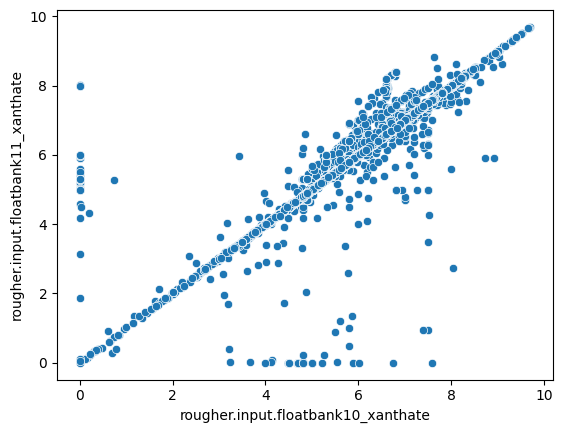

In [19]:
sns.scatterplot(x = 'rougher.input.floatbank10_xanthate', y = 'rougher.input.floatbank11_xanthate', data = full);

> Оба признака распределены практически одинаково и в большинстве случаев повторяют друг друга. Заполним пропуски для floatbank11 известными значениями из floatbank10.

In [20]:
train['rougher.input.floatbank11_xanthate'] = (train['rougher.input.floatbank11_xanthate']
                                               .fillna(full['rougher.input.floatbank10_xanthate']))
test['rougher.input.floatbank11_xanthate'] = (test['rougher.input.floatbank11_xanthate']
                                               .fillna(full['rougher.input.floatbank10_xanthate']))

In [21]:
# Проверим, как выглядит пропущенная строка и примем решение
display(
    full.loc[full[full['secondary_cleaner.state.floatbank5_a_level'].isna()].index-1],
    full.loc[full[full['secondary_cleaner.state.floatbank5_a_level'].isna()].index],
    full.loc[full[full['secondary_cleaner.state.floatbank5_a_level'].isna()].index+1]
)

,date,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.output.concentrate_au,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.recovery,rougher.output.tail_au,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,primary_cleaner.output.concentrate_au,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.tail_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,secondary_cleaner.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
19421,2018-08-17 17:59:59,10.018148,12.157881,4.187072,42.297118,629.869575,64.640971,21.212174,7.815061,1001.881444,-499.979072,1601.857535,-498.607855,1600.150978,-497.100764,1404.006789,-499.828588,1202.257112,-498.304955,1102.077526,-499.363824,21.202685,7.783254,41926.430282,3214.010084,3203.598599,2.392638,19.846317,13.874464,7.780895,29.02042,84.773069,2.666522,6.55585,0.904985,20.229227,226.482598,15.988715,7.25,1.177436,1551.478928,-500.297355,1552.263619,-500.38531,1551.033618,-501.084621,1548.019363,-498.248448,30.591992,11.823693,9.104889,20.79622,3.168791,17.790026,4.045769,8.07192,25.043738,-500.52718,22.9673,-499.16486,24.016298,-496.333432,22.972694,-500.758058,14.080498,-548.457442,11.982429,-549.290032,10.122944,-488.774842,7.968697,-500.079061,12.042943,-598.392513,3.366731,16.743933,5.303097,12.320883,42.867375,6.289592,10.800593,9.86864,72.591034,3.306867,11.979427,1.99416,15.428955


,date,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.output.concentrate_au,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.recovery,rougher.output.tail_au,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,primary_cleaner.output.concentrate_au,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.tail_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,secondary_cleaner.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
19422,2018-08-17 18:59:59,9.953462,12.028591,4.203939,41.78257,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1393.735867,-501.357678,1196.516363,-505.322143,1097.010735,-499.416892,NaN,NaN,NaN,NaN,NaN,2.367651,19.650397,13.678706,7.790201,28.779023,86.217222,2.435464,6.055658,0.862177,19.770304,NaN,NaN,7.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31.333106,11.345656,9.424562,20.275368,3.162975,17.514891,3.971093,7.845526,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.259027,16.134409,5.427901,12.116604,43.181003,5.782224,10.969985,9.30126,74.257359,3.091437,11.95976,2.064173,15.139256


,date,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.output.concentrate_au,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.recovery,rougher.output.tail_au,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,primary_cleaner.output.concentrate_au,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.tail_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,secondary_cleaner.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol
19423,2018-08-17 19:59:59,9.1868,10.681307,3.901517,41.562786,616.370312,65.949832,18.152634,7.800337,1000.771121,-499.00561,1599.803057,-500.740363,1599.383672,-500.010667,1401.533662,-500.539394,1200.064892,-500.157329,1099.516965,-500.102858,18.120019,7.792649,39994.394226,3210.019323,3148.8507,2.354674,19.585482,12.987662,7.942706,28.431386,84.83106,2.314505,5.526595,0.891034,18.961437,182.179285,14.984341,7.25,1.199236,1545.484903,-499.395904,1545.32695,-499.602128,1551.116769,-500.056331,1547.658107,-499.956738,31.894047,10.968054,9.765347,20.195485,3.232599,17.499777,3.994096,8.06215,25.013028,-499.510633,23.005987,-498.694189,24.071142,-498.889518,22.973289,-499.782048,13.954643,-564.670807,11.908144,-570.810245,10.004194,-509.665317,8.056656,-500.404815,11.964116,-599.140277,3.346496,16.361991,5.66595,12.161492,43.715161,5.518476,10.996012,9.156174,70.768558,3.154588,11.668317,2.158998,17.314961


In [22]:
# Так как значения, обычно, указывают на то, что осталось при обогащении -
# заполним пропущенные значения значением из предыдущей строки:
for key, value in datasets.items():
    value.fillna(method='ffill', inplace=True)

### Распределение данных в обучающей выборке

In [23]:
# Дату оставим в качестве индекса
train.set_index('date', inplace=True)
test.set_index('date', inplace=True)
full.set_index('date', inplace=True)

In [24]:
def show_hists(data, data_label, num_bins, rug=False, log_scale=False):
    """
    input: data - данные для построения гистограммы
           data_label - описание данных
           num_bins - количество ячеек
    output: None
    description: Функция строит гистограмму и boxplot для выбранного параметра:
                - Плотность распределения (методом distplot() библиотеки seaborn)
                - Boxplot (метод boxplot() библиотеки seaborn)
    """
    sns.set()
    f, axes = plt.subplots(1, 2, figsize=(16, 4))
    axes[0].set_title(data_label + ". Плотность распределения", fontsize=18)
    axes[0].set_ylabel('плотность', fontsize=15)
    sns.distplot(data, bins=num_bins, rug=rug, ax=axes[0])
    sns.violinplot(data=data, ax=axes[1])
    plt.show()

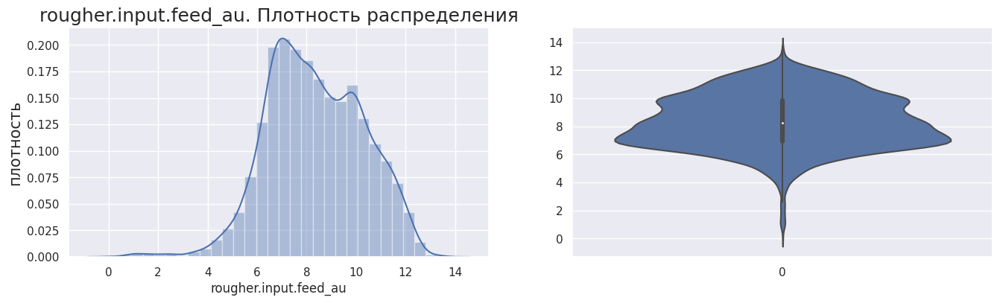

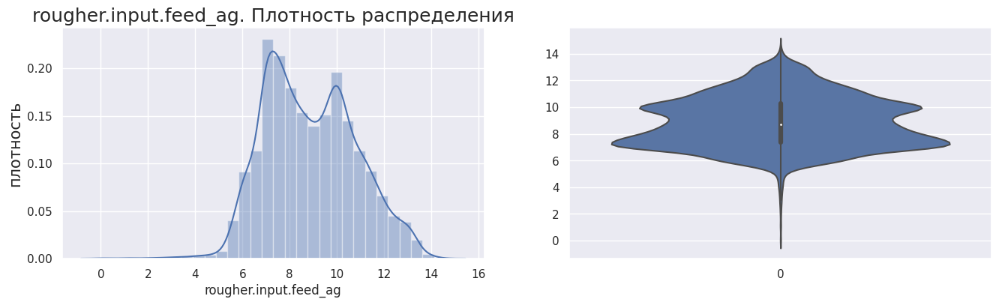

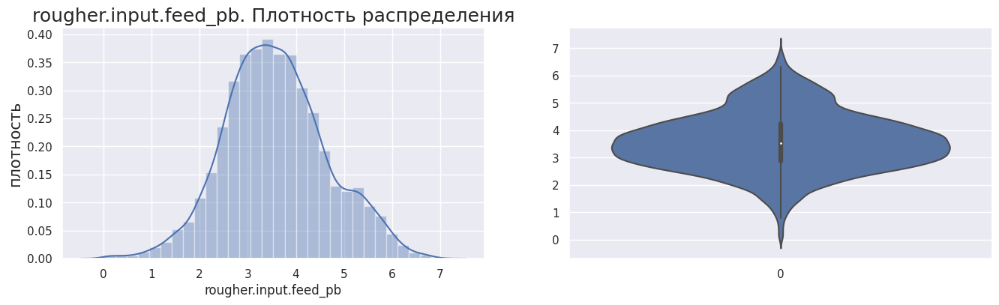

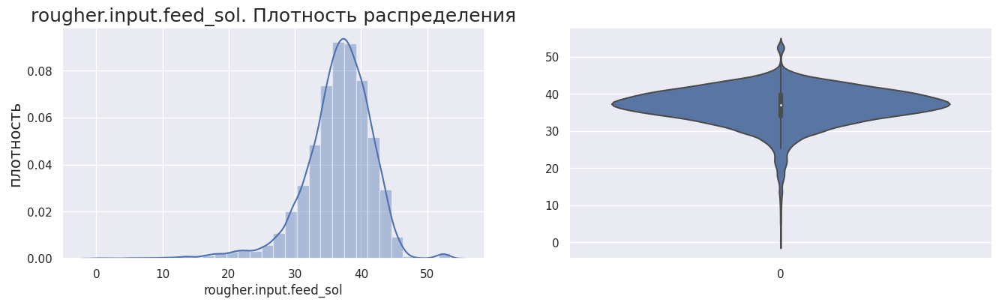

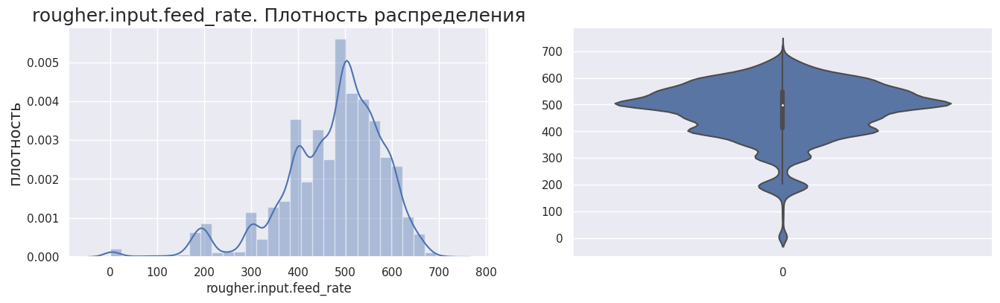

...

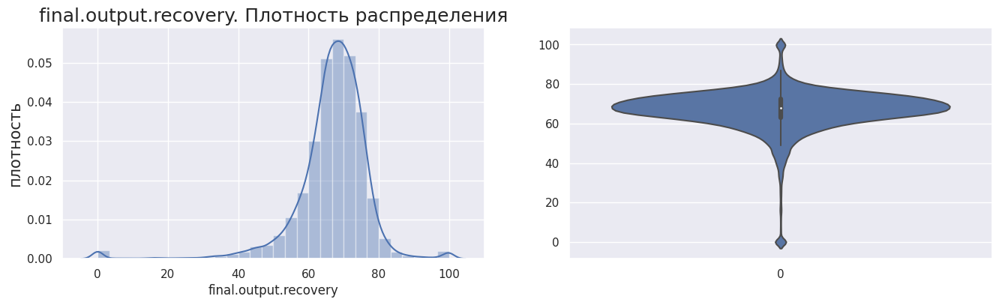

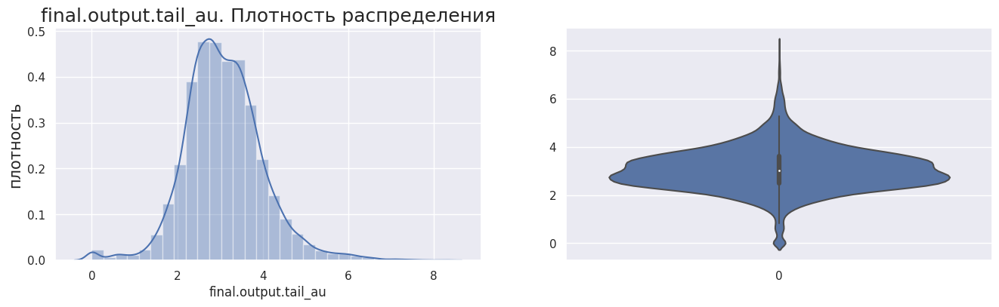

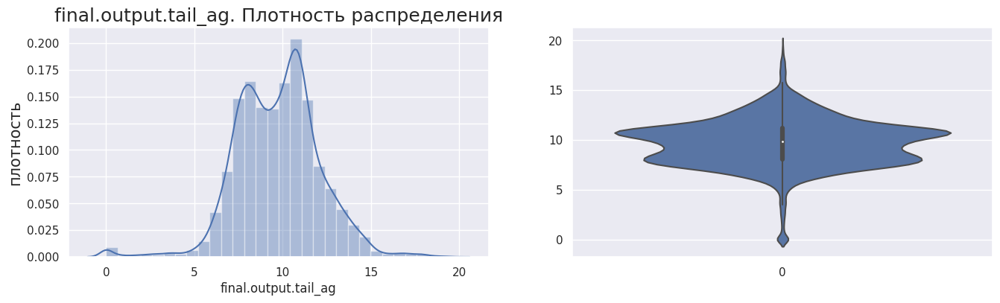

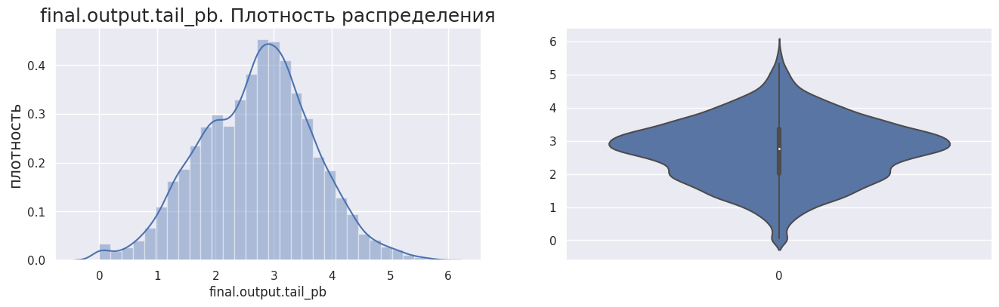

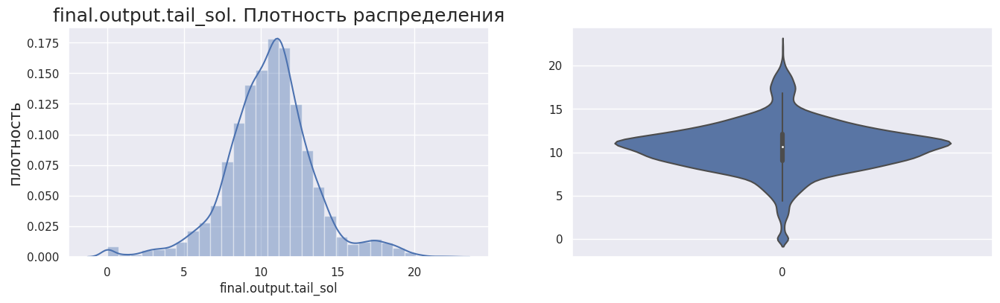

In [25]:
for column in train.columns:
    show_hists(train[column], column, num_bins=30)

> Распределения некоторых признаков отличаются от нормального. Например, у признаков rougher.calculation.floatbank10_sulfate_to_au_feed (γ1 = 79.13686296) и rougher.calculation.floatbank11_sulfate_to_au_feed (γ1 = -67.7763588) очень высокий показатель асимметрии, что означает, что данные сильно скошены в одну или другую сторону (состояние, когда один хвост распределения длиннее другого)
>
> Также присутствуют большие выбросы. После отбора признаков необходимо уменьшить их влияние на финальную модель (удалить выбросы, или прологарифмировать признак).
>
> Масштабы распределений отдельных признаков сильно отличаются друг от друга (более одного порядка). Отобранные признаки будут нуждаться в масштабировании.

### Подготовка обучающей выборки
Не все признаки подойдут для обучения модели.

Отберём те, которые больше всего коррелируют с целевыми признаками final.output.recovery, rougher.output.recovery.

Также удалим признаки, сильно коррелирующие с уже отобранными. Добавление таких признаков не увеличит качество модели, но увеличит её сложность и, возможно, дисперсию предсказаний.

Среди отобранных признаков рассмотрим аномалии.

In [26]:
input_columns = list(test.columns)
model_columns = ['final.output.recovery', 'rougher.output.recovery'] + input_columns

# визуально оценим мультиколлинеарность признаков на обучающей выборке
(train[model_columns].corr()
 .sort_values(by = 'final.output.recovery', ascending = False)
 .style.background_gradient(cmap = 'coolwarm')
)

,final.output.recovery,rougher.output.recovery,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
final.output.recovery,1.000000,0.304909,0.320317,0.309866,0.190770,0.260422,0.171624,0.024656,0.080964,0.325879,0.186673,0.064613,-0.116922,-0.061677,-0.148018,-0.069425,-0.143207,-0.061645,-0.113482,-0.053655,-0.084992,-0.048454,0.091414,0.317838,0.369489,0.174059,0.075191,0.211787,0.101752,0.000302,0.127851,0.055923,0.114004,0.005510,0.063053,-0.030635,0.096958,0.002253,0.108704,-0.002720,0.144185,0.016093,0.064158,0.006405,0.153605,0.039011,0.148340,-0.040722,0.049648,0.015129,0.042186,0.017449,-0.030521,-0.007104
primary_cleaner.input.sulfate,0.369489,0.281497,0.595647,0.494335,0.519971,0.414296,0.390237,-0.105017,0.492157,0.502098,0.118628,0.082777,-0.243102,-0.234675,-0.256396,-0.232029,-0.280720,-0.219841,-0.282640,-0.225487,-0.279498,-0.214030,0.562668,0.492138,1.000000,0.425136,0.124097,0.473127,-0.057519,-0.023294,-0.045886,-0.021478,-0.068462,-0.021089,0.081163,-0.067628,0.032083,0.088408,0.085862,0.114410,0.001170,-0.120441,0.008575,-0.097570,0.024874,-0.074030,0.101281,-0.040059,-0.099224,-0.114619,-0.060617,-0.073561,-0.176311,-0.061792
rougher.input.floatbank10_xanthate,0.325879,0.245887,0.212095,0.242221,0.076268,0.390245,0.608381,0.021732,0.175821,1.000000,0.085050,-0.003376,-0.134102,-0.285204,-0.170002,-0.286785,-0.165686,-0.262583,-0.039659,-0.271099,-0.073724,-0.240109,0.172738,0.927247,0.502098,0.349143,0.078497,0.428544,-0.017465,0.198296,-0.004829,0.147102,-0.023174,0.193249,-0.093174,0.088094,0.039897,0.105876,0.092987,0.104100,-0.041277,-0.139725,-0.048413,0.012874,0.033110,-0.202897,0.008117,-0.174957,-0.204661,-0.146955,-0.177059,-0.127415,-0.272925,0.049249
rougher.input.feed_au,0.320317,0.194406,1.000000,0.840868,0.723763,0.124188,-0.174520,-0.135544,0.264627,0.212095,0.193020,-0.052107,-0.149031,-0.044737,-0.138759,-0.036206,-0.183214,-0.030586,-0.182789,-0.006841,-0.205337,-0.004359,0.202922,0.204600,0.595647,0.382273,0.128275,0.221883,0.028100,-0.028778,0.053844,-0.021595,0.014946,-0.031458,0.121405,-0.069539,-0.124960,-0.045153,-0.054972,-0.045261,0.031005,0.040173,0.045589,-0.012133,0.015758,0.078172,0.095871,

In [27]:
columns_to_drop = ['rougher.input.floatbank10_xanthate',
                   'primary_cleaner.state.floatbank8_b_air',
                   'primary_cleaner.state.floatbank8_c_air',
                   'primary_cleaner.state.floatbank8_a_level',
                   'primary_cleaner.state.floatbank8_c_level',
                   'primary_cleaner.state.floatbank8_d_level',
                   'secondary_cleaner.state.floatbank2_a_air',
                   'secondary_cleaner.state.floatbank4_b_air',
                   'secondary_cleaner.state.floatbank5_b_air',
                   'secondary_cleaner.state.floatbank5_b_level',
                   'secondary_cleaner.state.floatbank2_a_level',
                   'rougher.state.floatbank10_b_level',
                   'rougher.input.floatbank10_sulfate',
                   'rougher.state.floatbank10_f_level',
                   'rougher.state.floatbank10_c_level',
                   'rougher.state.floatbank10_d_level',
                   'rougher.state.floatbank10_e_air',
                   'rougher.state.floatbank10_b_air',
                   'rougher.state.floatbank10_d_air'
                  ]

> Выбранные для удаления признаки относятся к параметрам, характеризующим текущее состояние этапов технологического процесса. Скорее всего, они напрямую связаны с оставшимися признаками (уровни жидкости и объёмы воздуха в разных floatbank напрямую зависят друг от друга). Предположу, что так настроен рабочий процесс, и данные лишние признаки можно удалить.
>
> Но так может быть не всегда. **Если зависимости между признаками изменятся в будущем (уровни жидкости и объёмы газа в разных floatbank станут независимыми), разработанная регрессионная модель может потерять свою актуальность. Необходимо следить за данными параметрами и в случае необходимости обновить модель.**

In [28]:
# Удалим выбранные признаки
model_columns = [column for column in model_columns if column not in columns_to_drop]
input_columns = [column for column in input_columns if column not in columns_to_drop]
train = train.drop(columns_to_drop, axis = 1)
test = test.drop(columns_to_drop, axis = 1)
set(train) == set (test)

False

### Выводы:
<ol>
    <li>Данные успешно загружены и проанализированы. Данные соответствуют описанию. Дубликатов нет. <b>Всего 19439 объектов и 86 признаков.</b> </li>
    <li><b>Показатель эффективности обогащения рассчитан корректно.</b></li>
    <li>В тестовой выборке отсутствуют параметры продукта, а также расчётные признаки на этапе флотации. Данные параметры не будут учасвовать в построении модели.</li>
    <li>Отобраны признаки, избыточные для модели (некоторые параметры, характеризующие текущее состояние этапов технологического процесса). Они не будут участвовать в построении модели. В случае изменения технологического процесса поведение данных признаков может измениться, и будет необходимо обновить модель.</li>
    <li>Для актуальных признаков <b>были заполнены пропуски на основе имеющихся исторических данных.</b></li>
    </ol>

## Анализ данных

### Анализ изменения концентрации металлов (Au, Ag, Pb)

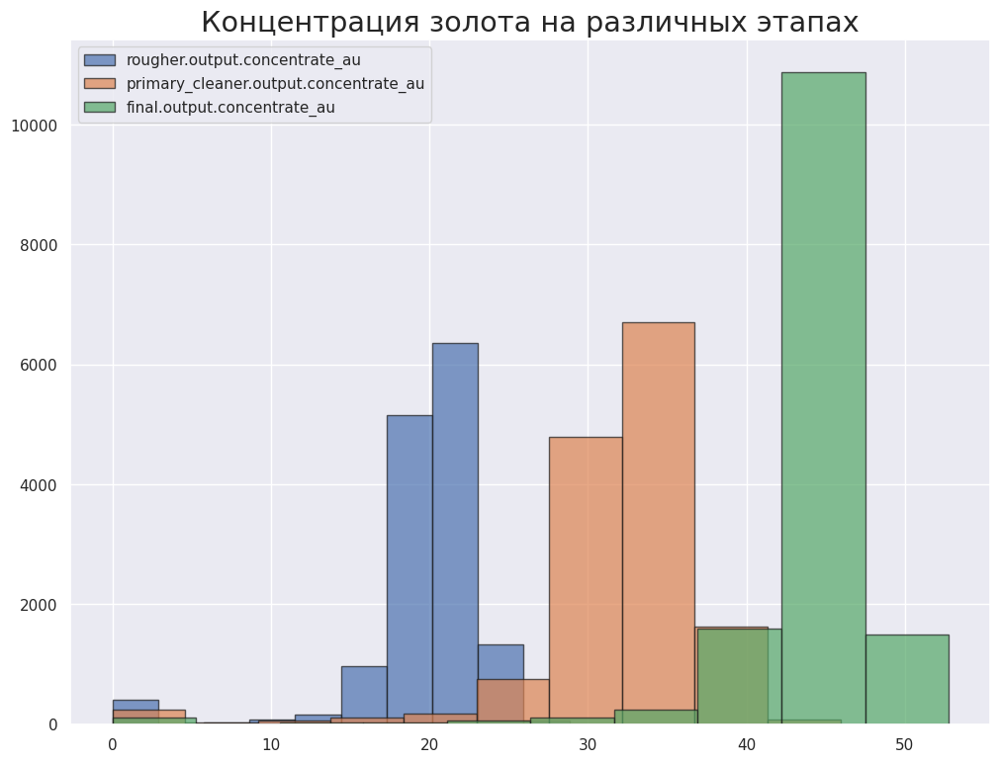

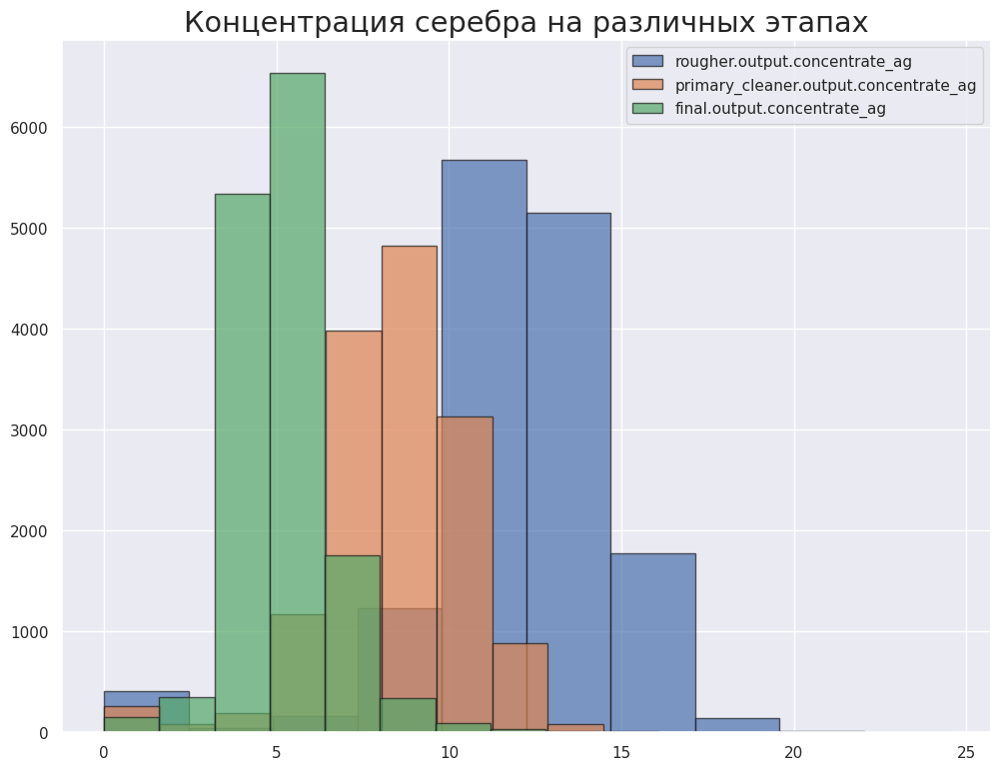

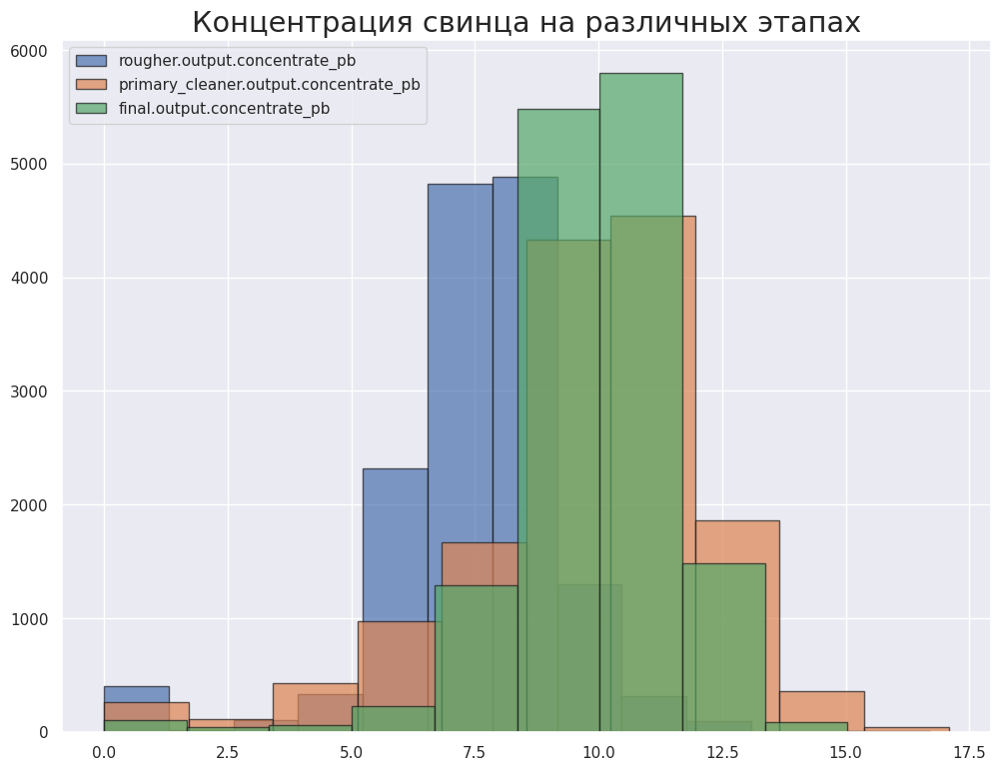

In [29]:
# Посмотрим, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки
# Список для цикла
sub_list = {'au':'золота',
            'ag':'серебра',
            'pb':'свинца'}

# Создаём цикл для вывода необходимых графиков
for sub in sub_list:
    plt.figure(figsize=(12,9))

    for col in train.columns:
        if ('concentrate_'+sub) in col:
            train[col].hist(alpha=0.7, edgecolor='k')

    plt.legend(list(filter(lambda col: ('concentrate_'+sub) in col, train.columns)))
    plt.title(f'Концентрация {sub_list[sub]} на различных этапах', fontsize='xx-large')
    plt.show();

In [30]:
# Рассмотрим отдельно каждый этап технологического процесса
met_concs = np.array([['rougher.input.feed_au', 'rougher.output.concentrate_au', 'primary_cleaner.output.concentrate_au', 'final.output.concentrate_au'],
                      ['rougher.input.feed_ag', 'rougher.output.concentrate_ag', 'primary_cleaner.output.concentrate_ag', 'final.output.concentrate_ag'],
                      ['rougher.input.feed_pb', 'rougher.output.concentrate_pb', 'primary_cleaner.output.concentrate_pb', 'final.output.concentrate_pb']]
                    )

def plot_met_time(cols, label):
    sns.set()
    f, axes = plt.subplots(1, 1, figsize=(16, 6))
    axes.set_title(label, fontsize=18)
    axes.set_ylabel('концентрация', fontsize=15)
    sns.lineplot(data=train[cols].groupby(train.index.floor('D')).mean());

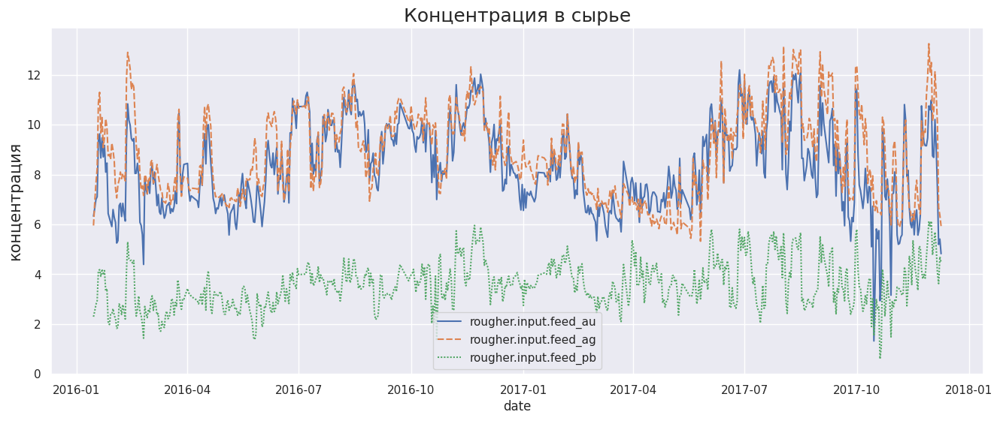

In [31]:
plot_met_time(met_concs[:,0], 'Концентрация в сырье')

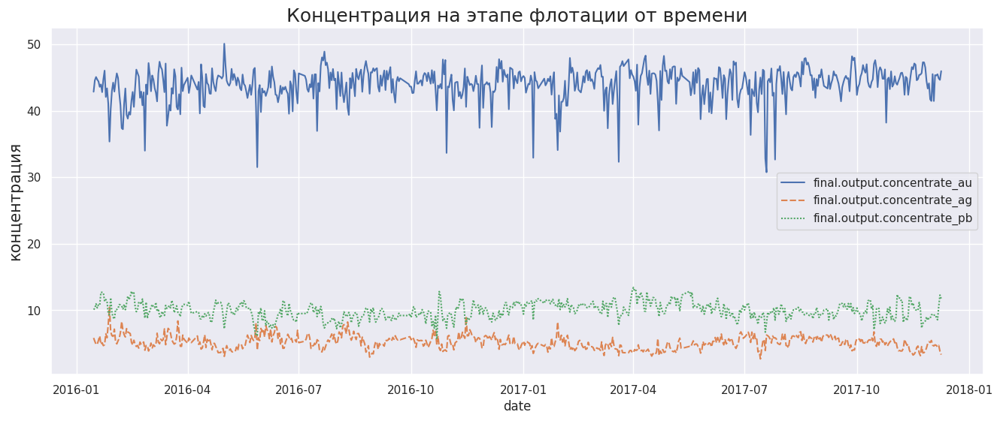

In [32]:
plot_met_time(met_concs[:,3], 'Концентрация на этапе флотации от времени')

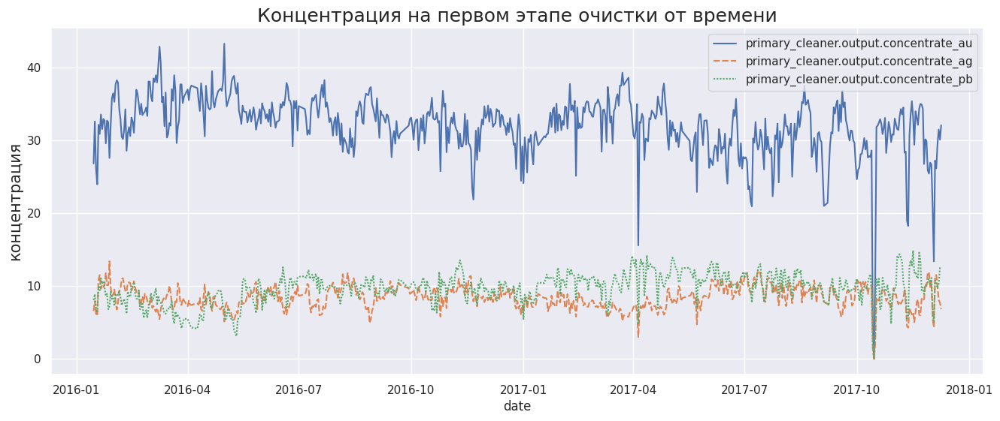

In [33]:
plot_met_time(met_concs[:,2], 'Концентрация на первом этапе очистки от времени')

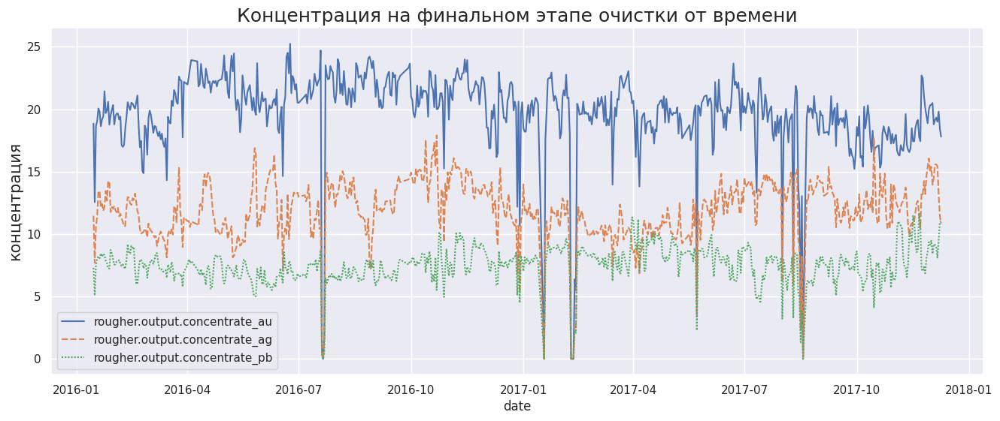

In [34]:
plot_met_time(met_concs[:,1], 'Концентрация на финальном этапе очистки от времени')

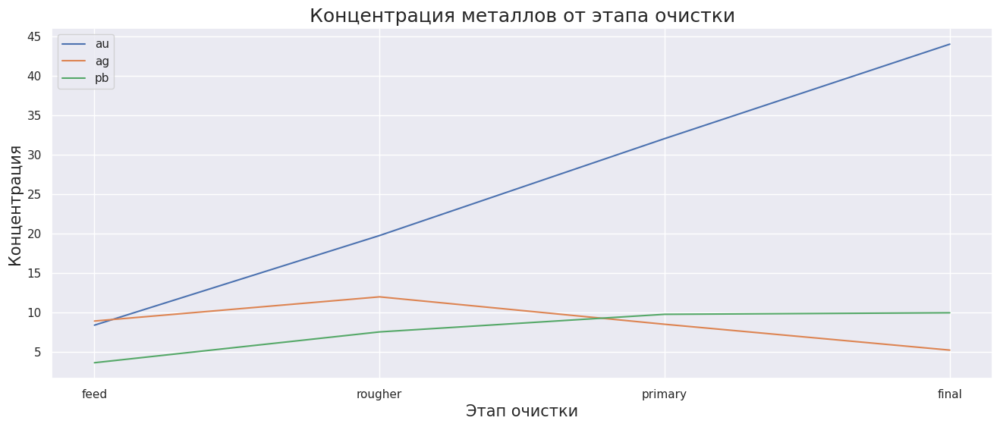

In [35]:
step_names = ['feed', 'rougher', 'primary', 'final']
mets = ['au', 'ag', 'pb']

sns.set()
f, axes = plt.subplots(1, 1, figsize=(16, 6))
axes.set_title('Концентрация металлов от этапа очистки', fontsize=18)
axes.set_ylabel('Концентрация', fontsize=15)
axes.set_xlabel('Этап очистки', fontsize=15)
for cols, met in zip(met_concs, mets):
    sns.lineplot(data = pd.Series(train[cols].mean().values, index=step_names),
                legend = 'full',
                label = met)
plt.gca();

In [36]:
print("Концентрация до флотации")
print("Концентрация Серебра:{: 0.2f},Свинца:{: 0.2f},Золота:{: 0.2f}".
format(train["rougher.input.feed_ag"].mean(),
train["rougher.input.feed_pb"].mean(),
train["rougher.input.feed_au"].mean()))
print()
print("Концентрация после флотации")
print("Коцентрация Серебра:{: 0.2f},Свинца:{: 0.2f},Золота:{: 0.2f}".
format(train["rougher.output.concentrate_ag"].mean(),
train["rougher.output.concentrate_pb"].mean(),
train["rougher.output.concentrate_au"].mean()))
print()
print("Концентрация после первичной очистки")
print("Концентрация Серебра:{: 0.2f},Свинца:{: 0.2f},Золота:{: 0.2f}".
format(train["primary_cleaner.output.concentrate_ag"].mean(),
train["primary_cleaner.output.concentrate_pb"].mean(),
train["primary_cleaner.output.concentrate_au"].mean()))
print()
print("Концентрация поле вторичной очистки")
print("Концентрация Серебра:{: 0.2f},Свинца:{: 0.2f},Золота:{: 0.2f}".
format(train["final.output.concentrate_ag"].mean(),
train["final.output.concentrate_pb"].mean(),
train["final.output.concentrate_au"].mean()))

Концентрация до флотации
Концентрация Серебра: 8.88,Свинца: 3.59,Золота: 8.35

Концентрация после флотации
Коцентрация Серебра: 11.94,Свинца: 7.50,Золота: 19.72

Концентрация после первичной очистки
Концентрация Серебра: 8.47,Свинца: 9.73,Золота: 32.01

Концентрация поле вторичной очистки
Концентрация Серебра: 5.19,Свинца: 9.92,Золота: 43.98


#### Выводы:
<ul>
    <li>На графиках прослеживается увеличение концентрации золота в смеси с каждым новым этапом очистки.</li>
    <li>Также увеличивается концентрация золота относительно других металлов.</li>
    <li>С каждым этапом очистки концентрация серебра в смеси немного падает, а концентрация свинца немного растёт.</li>
    <li>На всех графиках концентрация металлов в среднем не сильно зависит от времени. Это говорит о стабильности тех. процесса и сырья.</li>
    <li>Периодически графики сваливаются в ноль. Значения неверные. В эти моменты контроль концентрации не проводился или данные были утеряны. Их следует удалить.</li>
    </ul>

### Сравнение распределений размеров гранул сырья

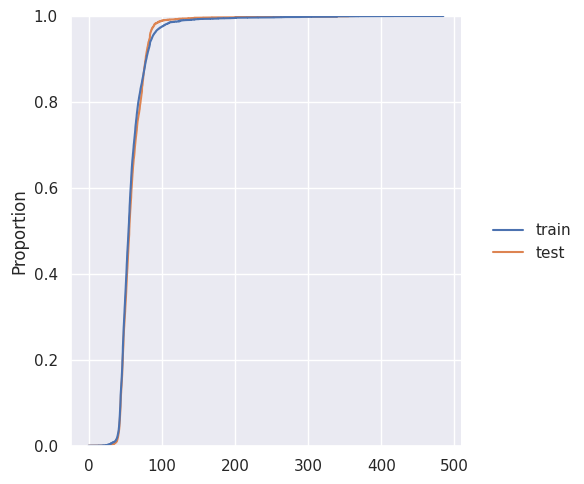

In [37]:
# Сравним графики выборочной функции распределения на двух выборках
feed_size = pd.concat([train['rougher.input.feed_size'], test['rougher.input.feed_size']], axis = 1)
feed_size.columns = ['train', 'test']
sns.displot(feed_size, kind = 'ecdf')
plt.show()

> Графики почти совпадают, можно предположить, что отличия между распределениями размеров гранул сырья не существенны. Можно посмотреть на основные статистические показатели:

In [38]:
train[['rougher.input.feed_size']].describe().T

,count,mean,std,min,25%,50%,75%,max
rougher.input.feed_size,14579.0,59.070865,22.903811,0.049194,47.322462,54.464259,64.469177,484.967466


In [39]:
test[['rougher.input.feed_size']].dropna().describe().T

,count,mean,std,min,25%,50%,75%,max
rougher.input.feed_size,4860.0,59.13615,19.512497,0.046369,47.610795,55.461058,66.53891,363.989699


#### Выводы:
- Из графиков видим, что распределения немного отличаются. Это заметно и на средних значениях: среднее значение тренировочной выборки на 4 пункта больше среднего по тестовой выборке
- Делаем вывод, что отличия между распределениями размеров гранул сырья не существенны. Признак "Размер гранул сырья" можно использовать для обучения модели.

### Исследование суммарных концентраций веществ
Нужно рассмотреть суммарную концентрацию всех веществ на разных стадиях (в сырье, после флотации и в финальном концентрате после двух этапов очистки):

- rougher.input.feed_ - черновой концентрат до флотации в сырье
- rougher.output.concentrate_ - черновой концентрат после флотации
- final.output.concentrate_ - финальный концентрат после всех этапов

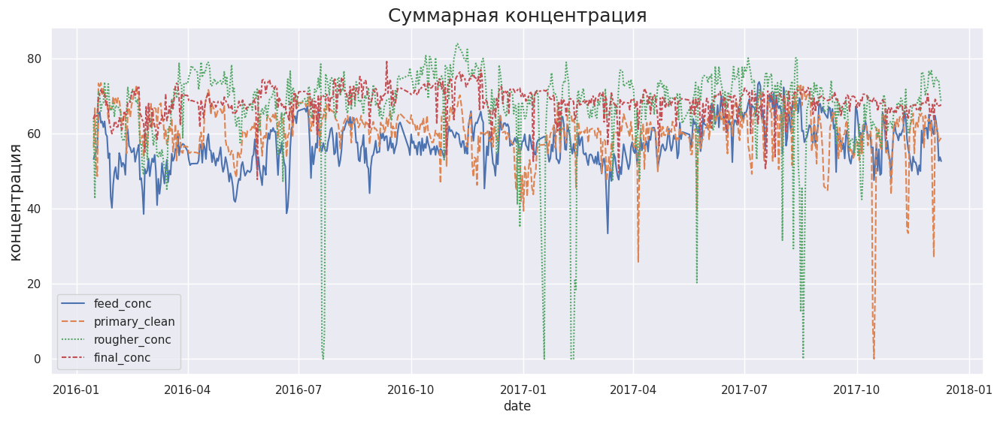

In [40]:
# Посчитаем общую концентрацию по всем веществам
train['feed_conc'] = train['rougher.input.feed_ag'] + train['rougher.input.feed_pb'] +\
            train['rougher.input.feed_sol'] + train['rougher.input.feed_au']
train['primary_clean'] = train['primary_cleaner.output.concentrate_ag'] + train['primary_cleaner.output.concentrate_pb'] +\
            train['primary_cleaner.output.concentrate_sol'] + train['primary_cleaner.output.concentrate_au']
train['rougher_conc'] = train['rougher.output.concentrate_ag'] + train['rougher.output.concentrate_pb'] +\
            train['rougher.output.concentrate_sol'] + train['rougher.output.concentrate_au']
train['final_conc'] = train['final.output.concentrate_ag'] + train['final.output.concentrate_pb'] +\
            train['final.output.concentrate_sol'] + train['final.output.concentrate_au']
# Построим графики по распределению концентраций
sum_conc_cols = ['feed_conc', 'primary_clean', 'rougher_conc', 'final_conc']
plot_met_time(sum_conc_cols, 'Суммарная концентрация')

In [41]:
# Объекты с нулевой суммарной концентрацией веществ
zero_objects = (train[
    (train['feed_conc'] == 0) |
    (train['primary_clean'] == 0) |
    (train['rougher_conc'] == 0) |
    (train['final_conc'] == 0)
])
print('доля объектов с противоречивыми показателями:', round(
    (len(zero_objects) / len(train)) * 100, 2), '%')
display(zero_objects.head())

доля объектов с противоречивыми показателями: 4.05 %


,rougher.input.feed_au,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_sol,rougher.input.feed_rate,rougher.input.feed_size,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.output.concentrate_au,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.recovery,rougher.output.tail_au,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.output.concentrate_au,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.tail_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,secondary_cleaner.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,final.output.concentrate_au,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.recovery,final.output.tail_au,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,feed_conc,primary_clean,rougher_conc,final_conc
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 14:00:00,6.801254,6.046063,2.777324,40.381002,571.766992,62.823127,999.708593,-400.075046,1602.333794,-448.145152,1400.906088,14.814722,7.064408,41959.818540,3507.941540,3499.552368,2.448851,18.511902,10.788951,7.537074,26.092838,86.241795,1.369732,4.919573,0.739863,20.309714,149.998260,12.509947,7.25,0.997030,1599.617983,-499.554869,1601.900702,0.000000,0.000000,0.000000,0.000000,2.013487,14.915949,2.702527,7.784534,24.013000,-500.297031,24.022240,-499.329964,24.012891,-499.923981,14.001632,-509.808331,-510.782166,10.032043,-499.128183,13.949790,-600.140776,2.138772,12.708557,4.565723,9.997717,42.509402,5.658943,10.436002,5.942418,70.348300,2.272460,10.232392,1.174845,19.498566,56.005644,0.000000,62.930764,64.546766
2016-01-15 17:00:00,6.610732,5.599324,2.525838,41.302359,571.140653,64.816398,1000.107388,-399.263233,1597.621485,-449.902838,1400.723107,14.460181,7.298780,42082.414968,3506.178699,3501.343118,2.617243,18.089134,10.958096,7.267608,25.911055,88.132239,1.157287,4.421208,0.705108,20.397352,158.353434,14.020791,7.25,0.997999,1596.351031,-500.402418,1600.472486,0.000000,0.000000,0.000000,0.000000,1.964468,13.874346,2.440897,8.529620,24.039935,-499.368998,24.027888,-501.291317,23.994020,-499.715395,13.943970,-541.642068,-550.493894,9.985232,-499.796583,13.973257,-600.054998,2.018144,11.523559,4.466500,10.776495,41.406172,6.118749,10.483007,6.546983,69.823900,2.245145,10.322077,1.270956,19.384247,56.038252,0.000000,62.225893,64.554911
2016-01-16 01:00:00,6.524249,5.689557,2.508414,43.042457,583.537789,64.616077,999.750176,-399.931753,1600.517301,-447.699241,1401.919470,14.205313,7.298306,41974.790294,3501.482821,3497.9

> Наблюдаются аномалии - резкий спад суммарных концентраций до 0. Для суммарного показателя это вероятнее всего значит прерывание процесса. В эти моменты целевые признаки не записывались. Данные бесполезны и подлежат удалению.

In [42]:
before_len = len(train)
train = train.loc[(train['feed_conc'] > 10) &
                  (train['primary_clean'] > 10) &
                  (train['rougher_conc'] > 10) &
                  (train['final_conc'] > 10)]
print("Удалено {} объектов".format(before_len - len(train)))

Удалено 728 объектов


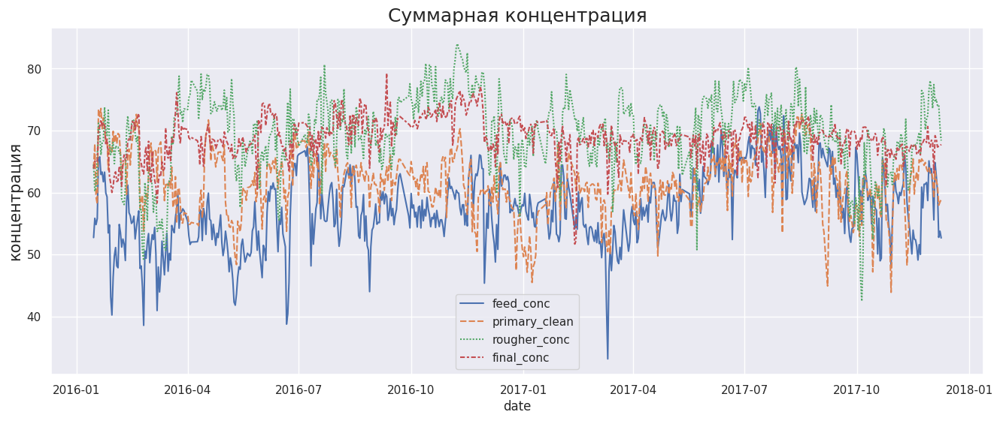

In [43]:
plot_met_time(sum_conc_cols, 'Суммарная концентрация')

> На данном шаге мы изучили суммарную концентрацию веществ на всех стадиях технологического процесса, обнаружили объекты с нулевыми показателями, причем эти нулевые значения сложно объяснить рациональными причинами, поскольку они обнаруживаются на любой стадии очистки, сочли объекты с такими показателями за аномалии и удалили их.

## Модель
Для предсказания эффективности обогащения на этапе флотации могут быть использованы только признаки, доступные в технологическом процессе на момент вычисления данного параметра (признаки с префиксом rougher).

Необходимо обучить две модели для двух целевых признаков rougher.output.recovery и final.output.recovery. Для оценки качества модели будем использовать кросс валидацию.

In [44]:
rougher_columns = []
pattern = re.compile('rougher')
print('Признаки для предсказания эффективности обогащения на этапе флотации:')
for column in list(test.columns):
    if re.match(pattern, column):
        rougher_columns.append(column)
        print(' - ', column)

Признаки для предсказания эффективности обогащения на этапе флотации:
 -  rougher.input.feed_au
 -  rougher.input.feed_ag
 -  rougher.input.feed_pb
 -  rougher.input.feed_sol
 -  rougher.input.feed_rate
 -  rougher.input.feed_size
 -  rougher.state.floatbank10_a_air
 -  rougher.state.floatbank10_a_level
 -  rougher.state.floatbank10_c_air
 -  rougher.state.floatbank10_e_level
 -  rougher.state.floatbank10_f_air
 -  rougher.input.floatbank11_sulfate
 -  rougher.input.floatbank11_xanthate


###  Функция итоговой sMAPE

In [45]:
def smape(y_true,y_pred):
    """
    input:        y_true    - реальные значения целевого признака
                  y_pred - предсказания модели
    output:       smape - симметричное среднее абсолютное процентное отклонение
    description:  функция рассчитывает и возвращает метрику smape
                  по реальным значениям целевого признака и предсказаниям модели
    """
    return 1 / len(y_true) * sum( abs(y_true - y_pred) / ( (abs(y_true) + abs(y_pred)) * 0.5) ) * 100

In [46]:
def final_smape(smape_r, smape_f):
    """
    input:        r_true    - реальные значения целевого признака (эффективность обогащения после флотации)
                  r_predict - предсказания модели (финальная эффективность обогащения)
                  f_true    - реальные значения целевого признака (эффективность обогащения после флотации)
                  f_predict - предсказания модели (финальная эффективность обогащения)
    output:       final smape - финальное симметричное среднее абсолютное процентное отклонение
    description:  функция рассчитывает и возвращает метрику final smape
                  по реальным значениям целевых признаков и предсказаниям моделей
    """
    return 0.25 * smape_r + 0.75 * smape_f

In [47]:
smape_scorer = make_scorer(smape, greater_is_better=False)

### Обучение и оценка качества моделей

In [48]:
# Создадим две отдельные обучающие выборки: для предсказания эффекивности обогащения после флотации и после очистки
train_r = train.loc[~train['rougher.output.recovery'].isna()]
train_f = train.loc[~train['final.output.recovery'].isna()]
print('Количество объектов обучающей выборки: {}'.format(len(train_r)))
print('Количество объектов обучающей выборки: {}'.format(len(train_f)))

# Выделим в обучающей выборке признаки и целевые признаки
X_r = train_r[rougher_columns]
X_f = train_f[input_columns]
y_r = train_r['rougher.output.recovery']
y_f = train_f['final.output.recovery']
test_r = test[rougher_columns]
test_f = test[input_columns]

# Убедимся, что обучающие и тестовые выборки содержат одинаковые признаки
print('Сравнение признаков для модели на этапе флотации:', set(X_r) == set(test_r))
print('Сравнение признаков для модели на этапе очистки:', set(X_f) == set(test_f))

Количество объектов обучающей выборки: 13851
Количество объектов обучающей выборки: 13851
Сравнение признаков для модели на этапе флотации: True
Сравнение признаков для модели на этапе очистки: True


In [49]:
# Масштабируем признаки на обучающей и тестовой выборках с помощью метода StandardScaler
ss_r = StandardScaler()
ss_f = StandardScaler()
ss_r.fit(X_r)
ss_f.fit(X_f)

X_r = pd.DataFrame(ss_r.transform(X_r), columns = rougher_columns)
X_f = pd.DataFrame(ss_f.transform(X_f), columns = input_columns)
test_f_ind = test.index
test_r_ind = test_r.index
test_r = pd.DataFrame(ss_r.transform(test_r), columns = rougher_columns, index = test_r_ind)
test_f = pd.DataFrame(ss_f.transform(test), columns = input_columns, index = test_f_ind)

### Модель Линейная регресия

In [50]:
# Инициализируем модель
lm_r = LinearRegression()

# Обучим модель для этапа флотации
smape_lm_r = cross_val_score(lm_r, X_r, y_r,
                             scoring = make_scorer(smape),
                             cv = 5,
                             n_jobs = -1).mean()
lm_f = LinearRegression()

# Обучим модель для финального этапа
smape_lm_f = cross_val_score(lm_f, X_f, y_f,
                             scoring = make_scorer(smape),
                             cv = 5,
                             n_jobs = -1).mean()
print('Линейная регрессия:')
print('    sMAPE rougher: {:.2f} %'.format(smape_lm_r))
print('    sMAPE cleaner: {:.2f} %'.format(smape_lm_f))
print('Final sMAPE: {:.2f} %'.format(final_smape(smape_lm_r, smape_lm_f)))

Линейная регрессия:
    sMAPE rougher: 6.26 %
    sMAPE cleaner: 9.42 %
Final sMAPE: 8.63 %


### Модель Дерево решений

In [51]:
param_grid = {"min_samples_split": [10, 20, 40],
              "max_depth": [2, 4, 6, 8],
              "min_samples_leaf": [20, 40, 100],
              "max_leaf_nodes": [5, 20, 100]
              }

# Инициализируем модель
dtr_r = DecisionTreeRegressor(random_state=12345)

# Инициализируем GridSearchCV
grid_search_r = GridSearchCV(estimator = dtr_r,
                             param_grid = param_grid,
                             cv = 5,
                             scoring = smape_scorer)
# Обучим модель для этапа флотации
grid_search_r.fit(X_r, y_r)

print(grid_search_r.best_params_)
print('    sMAPE rougher: {:.2f} %'.format(grid_search_r.best_score_))

{'max_depth': 2, 'max_leaf_nodes': 5, 'min_samples_leaf': 20, 'min_samples_split': 10}
    sMAPE rougher: -6.31 %


In [52]:
param_grid = {"min_samples_split": [10, 20, 40],
              "max_depth": [2, 4, 6, 8],
              "min_samples_leaf": [20, 40, 100],
              "max_leaf_nodes": [5, 20, 100]
              }

# Инициализируем модель
dtr_f = DecisionTreeRegressor(random_state=12345)

# Инициализируем GridSearchCV
grid_search_f = GridSearchCV(estimator = dtr_f,
                             param_grid = param_grid,
                             cv = 5,
                             scoring = smape_scorer)
# Обучим модель для финального этапа
grid_search_f.fit(X_f, y_f)

print(grid_search_f.best_params_)
print('    sMAPE cleaner: {:.2f} %'.format(grid_search_f.best_score_))

{'max_depth': 2, 'max_leaf_nodes': 5, 'min_samples_leaf': 100, 'min_samples_split': 10}
    sMAPE cleaner: -8.88 %


In [53]:
dtr_r = DecisionTreeRegressor(random_state=12345, max_depth=8, max_leaf_nodes=100, min_samples_leaf=20, min_samples_split=10)
smape_dtr_r = cross_val_score(dtr_r, X_r, y_r,
                             scoring = make_scorer(smape)).mean()
dtr_f = DecisionTreeRegressor(random_state=12345, max_depth=8, max_leaf_nodes=100, min_samples_leaf=20, min_samples_split=10)
smape_dtr_f = cross_val_score(dtr_f, X_f, y_f,
                             scoring = make_scorer(smape)).mean()

print('Дерево решений:')
print('    sMAPE rougher: {:.2f} %'.format(smape_dtr_r))
print('    sMAPE cleaner: {:.2f} %'.format(smape_dtr_f))
print('Final sMAPE: {:.2f} %'.format(final_smape(smape_dtr_r, smape_dtr_f)))

Дерево решений:
    sMAPE rougher: 7.36 %
    sMAPE cleaner: 11.44 %
Final sMAPE: 10.42 %


### Модель Случайный лес

In [54]:
%%time
param_grid = {'n_estimators': [50, 100, 150, 200, 250, 300],
              'max_depth': [1,2,3,4,5,6]
              }
# Инициализируем модель
rfr_r = RandomForestRegressor(random_state=12345)

# Инициализируем GridSearchCV
grid_search_r = GridSearchCV(estimator = rfr_r,
                             param_grid = param_grid,
                             scoring = smape_scorer)
# Обучим модель для этапа флотации
grid_search_r.fit(X_r, y_r)

print(grid_search_r.best_params_)
print('    sMAPE rougher: {:.2f} %'.format(grid_search_r.best_score_))

{'max_depth': 3, 'n_estimators': 150}
    sMAPE rougher: -6.05 %
CPU times: user 24min 21s, sys: 1.72 s, total: 24min 23s
Wall time: 24min 38s


In [55]:
%%time
param_grid = {'n_estimators': [50, 100, 150, 200, 250, 300],
              'max_depth': [1,2,3,4,5,6]
              }
# Инициализируем модель
rfr_f = RandomForestRegressor(random_state=12345)

# Инициализируем GridSearchCV
grid_search_f = GridSearchCV(estimator = rfr_f,
                             param_grid = param_grid,
                             scoring = smape_scorer)
# Обучим модель для финального этапа
grid_search_f.fit(X_f, y_f)

print(grid_search_f.best_params_)
print('    sMAPE cleaner: {:.2f} %'.format(grid_search_f.best_score_))

{'max_depth': 2, 'n_estimators': 150}
    sMAPE cleaner: -8.75 %
CPU times: user 59min 9s, sys: 3.75 s, total: 59min 13s
Wall time: 59min 24s


In [56]:
rfr_r = RandomForestRegressor(random_state=12345, max_depth=1,n_estimators=50)
smape_rfr_r = cross_val_score(rfr_r, X_r, y_r,
                             scoring = make_scorer(smape)).mean()
rfr_f = RandomForestRegressor(random_state=12345, max_depth=6,n_estimators=50)
smape_rfr_f = cross_val_score(rfr_f, X_f, y_f,
                             scoring = make_scorer(smape)).mean()

print('Случайный лес:')
print('    sMAPE rougher: {:.2f} %'.format(smape_rfr_r))
print('    sMAPE cleaner: {:.2f} %'.format(smape_rfr_f))
print('Final sMAPE: {:.2f} %'.format(final_smape(smape_rfr_r, smape_rfr_f)))

Случайный лес:
    sMAPE rougher: 6.94 %
    sMAPE cleaner: 9.15 %
Final sMAPE: 8.60 %


### Модель Elastic-Net
Подберём гиперпараметры для модели с помощью техники GridSearchCV библиотеки sklearn. Она последовательно обучает модель на всех заданных комбинациях гиперпараметров, используя кросс валидацию. Далее возвращает комбинацию гиперпараметров, с которыми модель достигла наилучшего значения метрики качества.

In [57]:
%%time
l1_ratios = np.linspace(0, 1, 11, endpoint=True)
alphas = np.linspace(0.1, 1, 10, endpoint=True)
param_grid = {'l1_ratio': l1_ratios,
              'alpha': alphas
             }
# инициализируем модель ElasticNet
en_r = ElasticNet()

# инициализируем GridSearchCV
grid_search_r = GridSearchCV(estimator = en_r,
                           param_grid = param_grid,
                           cv = 5,
                           n_jobs = -1,
                           verbose = 2,
                           scoring = smape_scorer)
grid_search_r.fit(X_r, y_r)

print(grid_search_r.best_params_)
print('    sMAPE rougher: {:.2f} %'.format(grid_search_r.best_score_))

Fitting 5 folds for each of 110 candidates, totalling 550 fits
{'alpha': 0.7000000000000001, 'l1_ratio': 0.6000000000000001}
    sMAPE rougher: -5.92 %
CPU times: user 674 ms, sys: 84.9 ms, total: 759 ms
Wall time: 17.5 s


In [58]:
%%time
l1_ratios = np.linspace(0, 1, 11, endpoint=True)
alphas = np.linspace(0.1, 1, 10, endpoint=True)
param_grid = {'l1_ratio': l1_ratios,
              'alpha': alphas
             }

# Инициализируем модель ElasticNet
en_f = ElasticNet()

# Инициализируем GridSearchCV
grid_search_f = GridSearchCV(estimator = en_f,
                           param_grid = param_grid,
                           cv = 5,
                           n_jobs = -1,
                           verbose = 2,
                           scoring = smape_scorer)
grid_search_f.fit(X_f, y_f)

print(grid_search_f.best_params_)
print('    sMAPE cleaner:   {:.2f} %'.format(grid_search_f.best_score_))

Fitting 5 folds for each of 110 candidates, totalling 550 fits
{'alpha': 0.7000000000000001, 'l1_ratio': 0.7000000000000001}
    sMAPE cleaner:   -8.56 %
CPU times: user 1.04 s, sys: 118 ms, total: 1.15 s
Wall time: 33.4 s


### Модель Lasso
Исходя из параметров, нйденных GridSearchCV, стоит поробовать модель с L1 регуляризацией

In [59]:
%%time
# Инициализируем модель Lasso
ls_r = Lasso(alpha=0.2)

# Обучим модель для этапа флотации
smape_ls_r = cross_val_score(ls_r, X_r, y_r,
                                scoring = make_scorer(smape),
                                cv = 5,
                                n_jobs = -1).mean()
smape_ls_r

CPU times: user 24.6 ms, sys: 73.9 ms, total: 98.5 ms
Wall time: 205 ms


6.200641669775401

In [60]:
%%time
# Инициализируем модель Lasso
ls_f = Lasso(alpha=0.4)

# Обучим модель для финального этапа
smape_ls_f = cross_val_score(ls_f, X_f, y_f,
                                scoring = make_scorer(smape),
                                cv = 5,
                                n_jobs = -1).mean()
smape_ls_f

CPU times: user 25.9 ms, sys: 2 ms, total: 27.9 ms
Wall time: 202 ms


8.664623453356352

In [61]:
print('Модель Lasso:')
print('    sMAPE rougher: {:.2f} %'.format(smape_ls_r))
print('    sMAPE cleaner: {:.2f} %'.format(smape_ls_f))
print('Final sMAPE: {:.2f} %'.format(final_smape(smape_ls_r, smape_ls_f)))

Модель Lasso:
    sMAPE rougher: 6.20 %
    sMAPE cleaner: 8.66 %
Final sMAPE: 8.05 %


<p>Лучше всего себя показывает модель Lasso:</p>
<li>sMAPE rougher = 6.26%</li>
<li>sMAPE cleaner = 9.22%</li>
<li>final sMAPE = 8.48%</li>
<p>Попробуем ещё увеличить качество модели путём исключения признаков, мало влияющих на целевой признак.</p>

### Модель KNN Regression

In [62]:
%%time
# Инициализируем модель KNN Regression
knn_r = KNeighborsRegressor(n_neighbors=500)

# Обучим модель для этапа флотации
smape_knn_r = cross_val_score(knn_r, X_r, y_r,
                                scoring = make_scorer(smape)).mean()

smape_knn_r

CPU times: user 6.96 s, sys: 154 ms, total: 7.12 s
Wall time: 7.12 s


6.147102114867591

In [63]:
%%time
# Инициализируем модель KNN Regression
knn_f = KNeighborsRegressor(n_neighbors=500)

# Обучим модель для финального этапа
smape_knn_f = cross_val_score(knn_f, X_r, y_r,
                                scoring = make_scorer(smape)).mean()
smape_knn_f

CPU times: user 8.45 s, sys: 134 ms, total: 8.58 s
Wall time: 8.65 s


6.147102114867591

In [64]:
print('Модель KNN Regression:')
print('    sMAPE rougher: {:.2f} %'.format(smape_knn_r))
print('    sMAPE cleaner: {:.2f} %'.format(smape_knn_f))
print('Final sMAPE: {:.2f} %'.format(final_smape(smape_knn_r, smape_knn_f)))

Модель KNN Regression:
    sMAPE rougher: 6.15 %
    sMAPE cleaner: 6.15 %
Final sMAPE: 6.15 %


###  Перемешивание признаков
Воспользуемся методом перемешивания признаков. По очереди будем перемешивать каждый признак на валидационной выборке и следить за изменениями качества предсказаний модели. Воспользуемся методом permutation_importance библиотеки sklearn.

In [65]:
def feature_reduction(X, y, n_neighbors, num_features, label):
    """
    input:       X - признаки для модели Lasso
                 y - целевой признак
                 alpha - параметр регуляризации для модели Lasso
                 num_features - количество признаков, которое необходимо оставить в модели
                 label - название этапа технологического процесса
    output:      chosen_cols - выбранные признаки для модели
                 smape_ls_red - значение метрики smape, рассчитанное на модели с применением кросс-валидации
    description: Функция делит входные данные на обучающую и валидационную выборки для отбора признаков
                 методом перемешивания. Функция использует метод `permutation_importance` из библиотеки sklearn.
                 Выводятся признаки в порядке убывания значимости для целевого признака (также выводятся средняя
                 значимость и стандартное отклонение). После производится отбор num_features наиболее важных
                 признаков. Модель Lasso обучается на новом пространстве пизнаков с применением кросс-валидации.
                 Выводится метрика smape.
    """
    # разделение выборки на обучающую и валидационную для расчёта важности признаков
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size = 0.25, random_state = 12345)

    # обучение модели Lasso
    knn = KNeighborsRegressor(n_neighbors=n_neighbors)
    knn.fit(X_train, y_train)

    # расчёт важности признаков методом перемешивания
    p_i = permutation_importance(knn, X_valid, y_valid,
                                 n_repeats=30,
                                 random_state=12345)

    # вывод признаков в порядке убывания важности
    for i in p_i.importances_mean.argsort()[::-1]:
        if p_i.importances_mean[i] - 2 * p_i.importances_std[i] > 0:
            print(f"{X_valid.columns[i]:<50}"
                  f"{p_i.importances_mean[i]:.3f}"
                  f" +/- {p_i.importances_std[i]:.3f}")

    # обучение модели на всех данных с уменьшенным количеством признаков
    chosen_cols = p_i.importances_mean.argsort()[::-1][:num_features]
    X_red = X.iloc[:, chosen_cols]
    smape_knn_red = cross_val_score(knn, X_red, y,
                                    scoring = make_scorer(smape),
                                    cv = 5,
                                    n_jobs = -1).mean()
    print()
    print(' sMAPE {} : {:.2f} %'.format(label, smape_knn_red))
    return chosen_cols, smape_knn_red

In [66]:
rougher_features, smape_knn_r_red = feature_reduction(X_r, y_r, n_neighbors=500, num_features=7, label='флотация')

rougher.input.feed_ag                             0.069 +/- 0.004
rougher.state.floatbank10_a_level                 0.062 +/- 0.005
rougher.input.feed_au                             0.061 +/- 0.005
rougher.input.feed_sol                            0.048 +/- 0.003
rougher.input.feed_pb                             0.028 +/- 0.003
rougher.state.floatbank10_a_air                   0.028 +/- 0.005
rougher.input.floatbank11_xanthate                0.022 +/- 0.003
rougher.state.floatbank10_c_air                   0.015 +/- 0.003
rougher.state.floatbank10_f_air                   0.007 +/- 0.002
rougher.state.floatbank10_e_level                 0.007 +/- 0.002
rougher.input.feed_rate                           0.006 +/- 0.002

 sMAPE флотация : 5.40 %


In [67]:
cleaner_features, smape_knn_f_red = feature_reduction(X_f, y_f, n_neighbors=500, num_features=10, label='очисткка')

primary_cleaner.input.sulfate                     0.018 +/- 0.002
rougher.input.feed_au                             0.017 +/- 0.002
rougher.input.floatbank11_xanthate                0.015 +/- 0.001
rougher.input.feed_ag                             0.012 +/- 0.002
rougher.input.feed_sol                            0.010 +/- 0.001
primary_cleaner.input.xanthate                    0.007 +/- 0.001
rougher.input.feed_pb                             0.006 +/- 0.001
rougher.input.floatbank11_sulfate                 0.004 +/- 0.001
rougher.input.feed_rate                           0.004 +/- 0.001
primary_cleaner.state.floatbank8_a_air            0.004 +/- 0.001
primary_cleaner.input.feed_size                   0.003 +/- 0.001

 sMAPE очисткка : 8.63 %


In [68]:
print('Итоговое sMAPE на кросс-валидации: {:.2f} %'.format(final_smape(smape_knn_r_red, smape_knn_f_red)))

Итоговое sMAPE на кросс-валидации: 7.82 %


In [69]:
X_r_red = X_r.iloc[:,rougher_features]
print('Итоговые признаки для модели на этапе флотации:')
print(pd.Series(X_r_red.columns))

Итоговые признаки для модели на этапе флотации:
0                 rougher.input.feed_ag
1     rougher.state.floatbank10_a_level
2                 rougher.input.feed_au
3                rougher.input.feed_sol
4                 rougher.input.feed_pb
5       rougher.state.floatbank10_a_air
6    rougher.input.floatbank11_xanthate
dtype: object


In [70]:
X_f_red = X_f.iloc[:,cleaner_features]
print('Итоговые признаки для модели на этапе очистки:')
print(pd.Series(X_f_red.columns))

Итоговые признаки для модели на этапе очистки:
0             primary_cleaner.input.sulfate
1                     rougher.input.feed_au
2        rougher.input.floatbank11_xanthate
3                     rougher.input.feed_ag
4                    rougher.input.feed_sol
5            primary_cleaner.input.xanthate
6                     rougher.input.feed_pb
7         rougher.input.floatbank11_sulfate
8                   rougher.input.feed_rate
9    primary_cleaner.state.floatbank8_a_air
dtype: object


### Тестирование модели

In [71]:
# из исходных данных сохраним целевые признаки для тестовой выборки
y_true_r = full.loc[test.index, 'rougher.output.recovery'].dropna()
y_true_f = full.loc[test.index, 'final.output.recovery'].dropna()
# создадим тестовые выборки признаков с валидными индексами для обоих этапов
test_r = test_r.loc[y_true_r.index]
test_f = test_f.loc[y_true_f.index]
test_r = test_r[X_r_red.columns]
test_f = test_f[X_f_red.columns]

In [72]:
# инициализируем модели KNN Regression с подобранными ранее параметрами
model_r = KNeighborsRegressor(n_neighbors=500)
model_f = KNeighborsRegressor(n_neighbors=500)

# обучене моделей и получение предсказаний
model_r.fit(X_r_red, y_r)
model_f.fit(X_f_red, y_f)
predict_r = model_r.predict(test_r)
predict_f = model_f.predict(test_f)

print('sMAPE флотации на тестовой выборке: {:.2f} %'.format(smape(y_true_r, predict_r)))
print('sMAPE очистки на тестовой выборке:  {:.2f} %'.format(smape(y_true_f, predict_f)))
smape_fin = final_smape(smape(y_true_r, predict_r), smape(y_true_f, predict_f))
print('Итоговая sMAPE на тестовой выборке: {:.2f} %'.format(smape_fin))

sMAPE флотации на тестовой выборке: 4.20 %
sMAPE очистки на тестовой выборке:  7.72 %
Итоговая sMAPE на тестовой выборке: 6.84 %


### Инициализируем и обучим константную модель
Сравним полученную модель с константной. Возьмём средние значения целевых признаков в обучающей выборке и посчитаем итоговое sMAPE на тестовых данных.

In [73]:
base_r = DummyRegressor(strategy="median")
base_f = DummyRegressor(strategy="median")
base_r.fit(X_r_red, y_r)
base_f.fit(X_f_red, y_f)
dummy_pred_r = base_r.predict(test_r)
dummy_pred_f = base_f.predict(test_f)

In [74]:
print('Константная модель')
print('sMAPE флотации на тестовой выборке: {:.2f} %'.format(smape(y_true_r, dummy_pred_r)))
print('sMAPE очистки на тестовой выборке:  {:.2f} %'.format(smape(y_true_f, dummy_pred_f)))
smape_dummy = final_smape(smape(y_true_r, dummy_pred_r), smape(y_true_f, dummy_pred_f))
print('Итоговая sMAPE на тестовой выборке: {:.2f} %'.format(smape_dummy))

Константная модель
sMAPE флотации на тестовой выборке: 5.84 %
sMAPE очистки на тестовой выборке:  9.12 %
Итоговая sMAPE на тестовой выборке: 8.30 %


> Финальная ошибка на обученной модели на 1% ниже, чем на константной модели.

## Выводы:
<ol>
    <li>На этапе предобработки данных:</li>
    <ul>
        <li>Данные успешно проанализированы: подготовили EDA отчёт для каждого датасета.</li>
        <li>Показатель эффективности обогащения рассчитан корректно.</li>
        <li>Отобраны признаки, избыточные и нерелевантные для модели (некоторые параметры, характеризующие текущее состояние этапов технологического процесса). В случае изменения технологического процесса поведение данных признаков может измениться, и будет необходимо обновить модель.</li>
        <li>Для актуальных признаков были заполнены пропуски на основе имеющихся исторических данных.</li>
    </ul>
    <li>На этапе анализа данных:</li>
    <ul>
        <li>Проанализированы концентрации металлов (Au, Ag, Pb), а также суммарные концентрации веществ на всех стадиях очистки. Прослеживается увеличение концентрации золота в смеси с каждым новым этапом очистки. Кроме того увеличивается концентрация золота относительно других металлов. Отметили, что концентрация металлов в среднем не сильно зависит от времени - это говорит о стабильности технтческого процесса и сырья. Однако, в данных наблюдаются нулевые значения - в эти моменты контроль концентрации не проводился или данные были утеряны.</li>
        <li>Рассмотрены распределения гранул сырья на входе технологического процесса для обучающей и тестовой выборок. Распределения не сильно отличаются друг от друга, средние значения отличаются на 4 пункта.</li>
        <li>Анализ суммарных концентраций подтвердил наличие аномальных данных. Все объекты с суммарной концентрацией смеси меньше 10 были удалены из тренировочной выборки. Всего удалено 579 объектов (3% данных).</li>
    </ul>
    <li>На этапе обучения и оценки качества моделей:</li>
    <ul>
        <li>Данные обучены на моделях Линейной регрессии, Дерево решений, Случайный лес, ElasticNet, Lasso и KNN Regression.
        <li>Отдельно оптимизировались модели для эффекивности обогащения после флотации и после очистки.</li>
        <li>Применены техники кросс-валидации для оценки качества моделей и GridSearchCV для поиска оптимальных гиперпараметров.</li>
        <li>Произведён отбор признаков для обучения обеих моделей методом перемешивания.</li>
        <li>sMAPE на тестовой выборке (модель KNN Regression):</li>
        <ul>
            <li>sMAPE флотация: 7.41 %</li>
            <li>sMAPE очистка: 9 %</li>
            <li>sMAPE итоговое: 8.51 %</li>
        </ul>
        <li>Метрика sMAPE на обученной модели на 1% ниже, чем на константной модели.</li>
    </ul>
    </ol>